In [2]:
!git clone https://github.com/clovaai/CRAFT-pytorch.git
%cd CRAFT-pytorch
import os

user_images_folder = '/content/user_images'

if not os.path.exists(user_images_folder):
    os.makedirs(user_images_folder)
    print(f"✅ Created directory: {user_images_folder}")
else:
    print(f"ℹ️ Directory already exists: {user_images_folder}")

print("Please upload your images into this directory using the file upload function in the left sidebar.")

fatal: destination path 'CRAFT-pytorch' already exists and is not an empty directory.
/content/CRAFT-pytorch
✅ Created directory: /content/user_images
Please upload your images into this directory using the file upload function in the left sidebar.


Downloading...
From: https://drive.google.com/uc?id=1Jk4eGD7crsqCCg9C9VjCLkMN3ze8kutZ
To: /content/CRAFT-pytorch/craft_mlt_25k.pth
100% 83.2M/83.2M [00:00<00:00, 166MB/s]
✅ Applied necessary fixes to test.py.
✅ Applied necessary fixes to basenet/vgg16_bn.py (added model_urls).
✅ Result folder created at /content/CRAFT-pytorch/result.
✅ Using images from: /content/user_images
Running text detection on images in /content/user_images...
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Loading weights from checkpoint (weights/craft_mlt_25

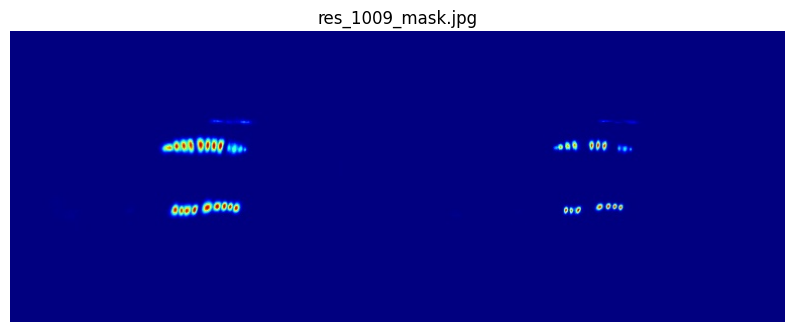

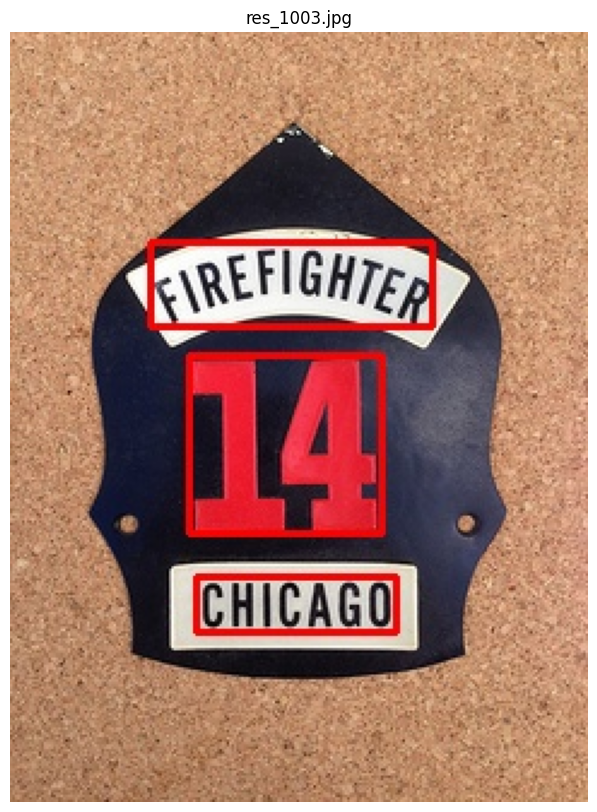

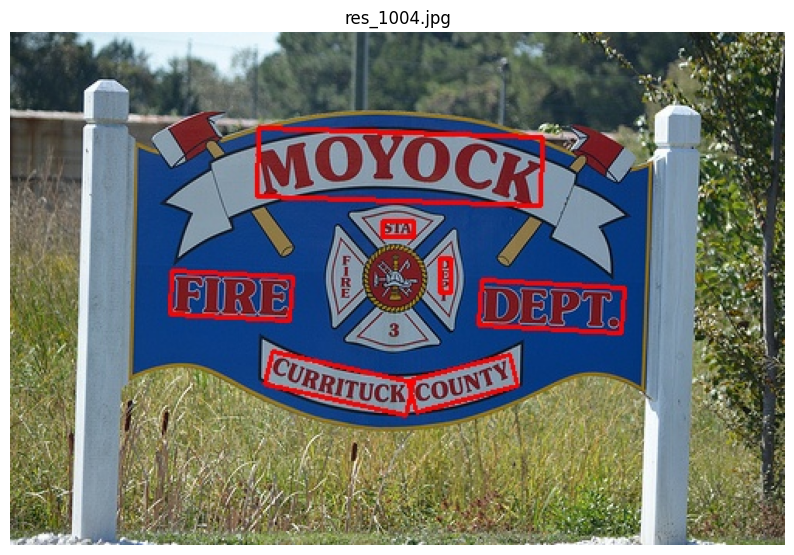

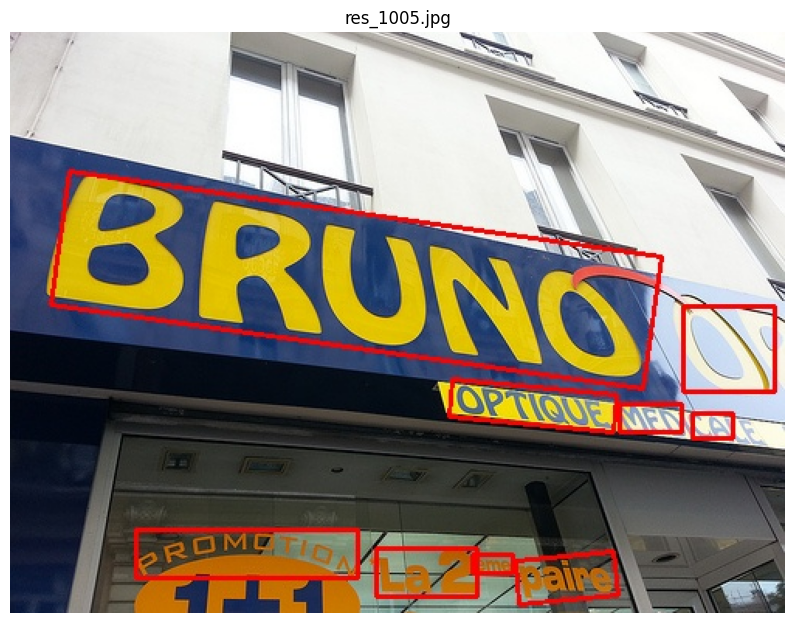

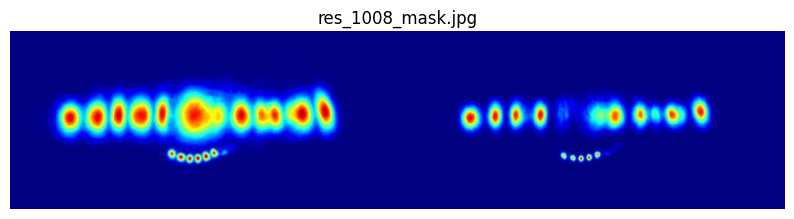

...

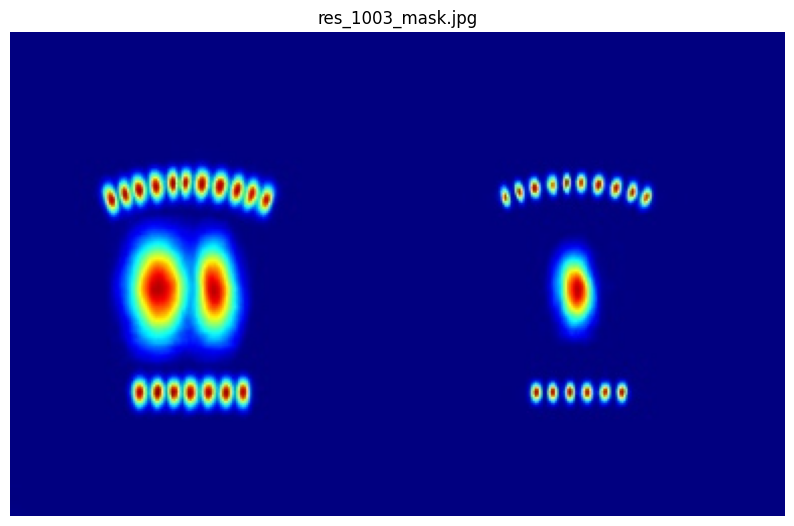

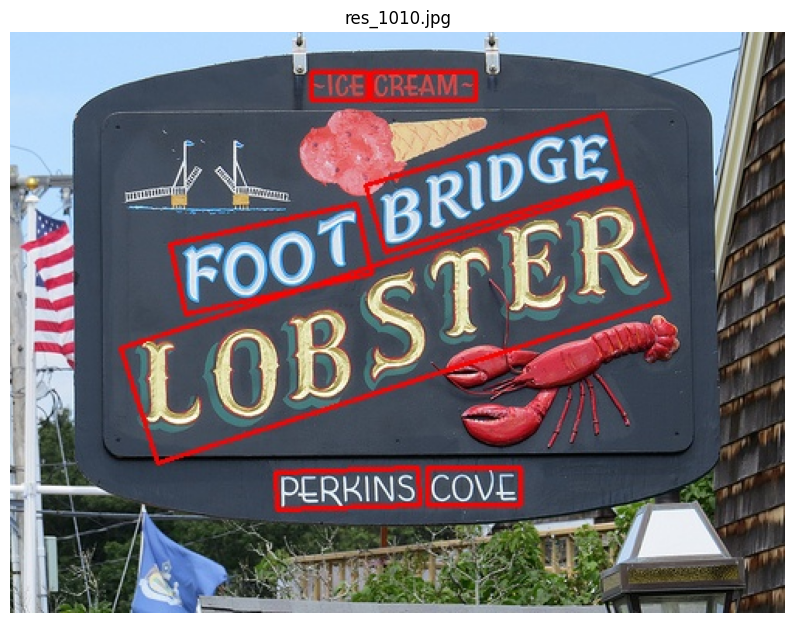

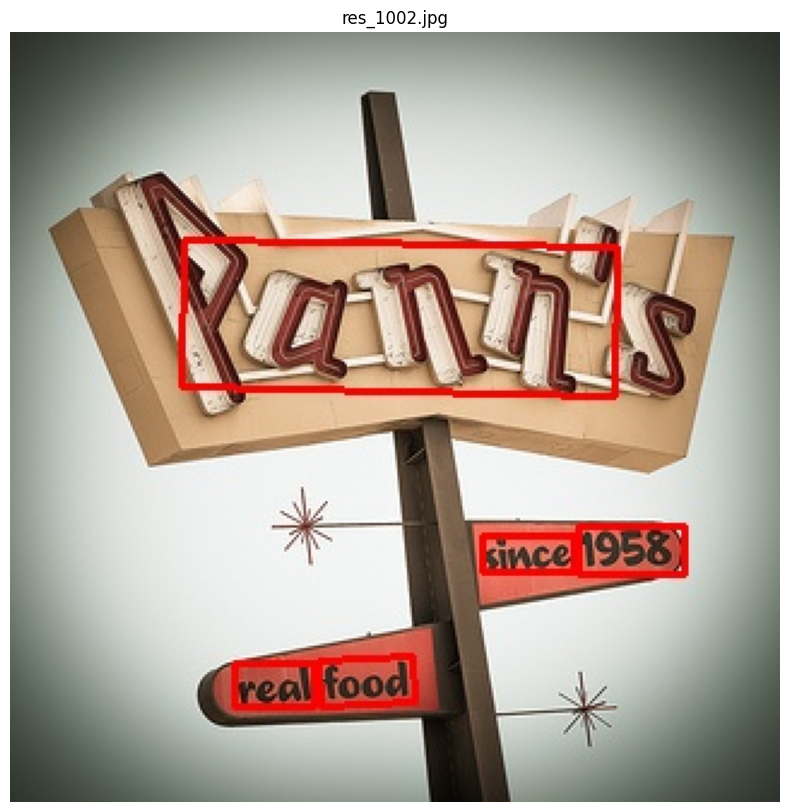

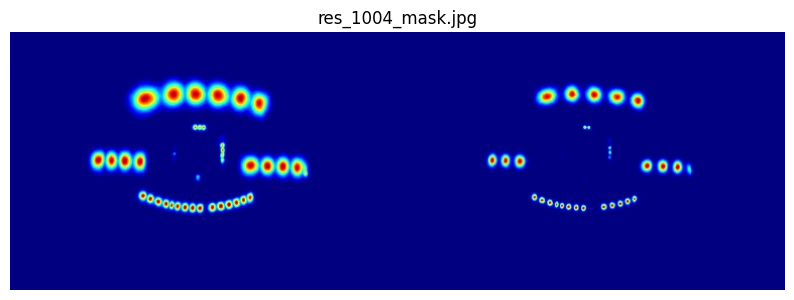

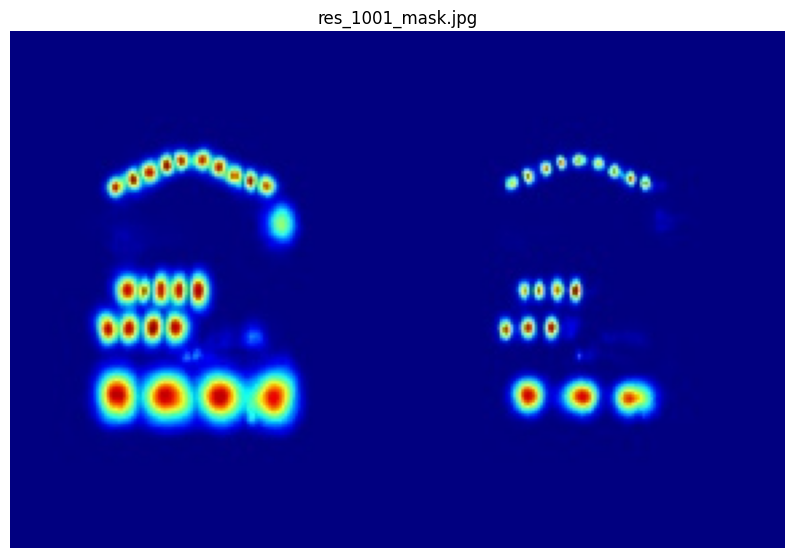

In [3]:
import os
import cv2
import matplotlib.pyplot as plt
import shutil # Import shutil

# Re-clone the repository to ensure it's in the correct location
#!git clone https://github.com/clovaai/CRAFT-pytorch.git /content/CRAFT-pytorch

# Change directory to the cloned repository
#%cd /content/CRAFT-pytorch

!gdown https://drive.google.com/uc?id=1Jk4eGD7crsqCCg9C9VjCLkMN3ze8kutZ -O craft_mlt_25k.pth
!mkdir -p weights && mv craft_mlt_25k.pth weights/

# Re-apply fixes to test.py (ensure CPU loading and no CUDA calls)
file_path = "test.py"
try:
    with open(file_path, "r") as file:
        content = file.read()

    # Fix model loading on CPU and remove .cuda() calls
    content = content.replace(
        "torch.load(args.trained_model)",
        "torch.load(args.trained_model, map_location='cpu')"
    )
    content = content.replace("net = net.cuda()", "")
    content = content.replace("refine_net = refine_net.cuda()", "")

    # Remove x.cuda() lines and adjust indentation
    lines = content.splitlines()
    fixed_lines = []
    skip_next_indent_check = False
    cuda_indent = ""

    for i, line in enumerate(lines):
        stripped = line.strip()

        if "x = x.cuda()" in stripped:
            continue

        if stripped.startswith("if cuda:"):
            cuda_indent = line[:len(line) - len(line.lstrip())]
            fixed_lines.append(line)
            continue

        if "with torch.no_grad():" in stripped:
            expected_indent = cuda_indent + "    "
            if not line.startswith(expected_indent):
                fixed_lines.append(expected_indent + stripped)
            else:
                fixed_lines.append(line)
            skip_next_indent_check = True
            continue

        if skip_next_indent_check:
            if line.strip():  # not a blank line
                inner_indent = expected_indent + "    "
                fixed_lines.append(inner_indent + stripped)
            else:
                fixed_lines.append(line)
            skip_next_indent_check = False
            continue

        fixed_lines.append(line)

    content = "\n".join(fixed_lines)

    with open(file_path, "w") as file:
        file.write(content)

    print("✅ Applied necessary fixes to test.py.")

except FileNotFoundError:
    print(f"❌ Error: test.py not found at {file_path}. Make sure CRAFT-pytorch repository is cloned correctly.")
    raise

# Fix ImportError for model_urls in basenet/vgg16_bn.py
file_path_vgg = "basenet/vgg16_bn.py"
try:
    with open(file_path_vgg, "r") as file:
        content_vgg = file.read()

    # Remove the problematic import line
    content_vgg = content_vgg.replace("from torchvision.models.vgg import model_urls", "")

    # Add the model_urls dictionary manually
    model_urls_dict = """
model_urls = {
    'vgg16_bn': 'https://download.pytorch.org/models/vgg16_bn-6c64b313.pth'
}
"""
    # Append the dictionary to the file
    content_vgg += model_urls_dict

    with open(file_path_vgg, "w") as file:
        file.write(content_vgg)

    print("✅ Applied necessary fixes to basenet/vgg16_bn.py (added model_urls).")

except FileNotFoundError:
    print(f"❌ Error: basenet/vgg16_bn.py not found at {file_path_vgg}. Make sure CRAFT-pytorch repository is cloned correctly.")
    raise


# Prepare result directory
result_dir = '/content/CRAFT-pytorch/result'
if os.path.exists(result_dir):
    print(f"Clearing contents of {result_dir}...")
    !rm -rf {result_dir}/*
    print("✅ Result folder cleared.")
else:
    os.makedirs(result_dir)
    print(f"✅ Result folder created at {result_dir}.")

# Path to the user's uploaded images (assuming they are in /content/user_images)
user_images_folder = '/content/user_images'

# Check if the user's images folder exists and contains files
if not os.path.exists(user_images_folder) or not os.listdir(user_images_folder):
    print(f"❌ User images folder not found or is empty at {user_images_folder}. Please upload your images.")
else:
    print(f"✅ Using images from: {user_images_folder}")

    # Run the test script
    print(f"Running text detection on images in {user_images_folder}...")
    !python3 test.py --trained_model=weights/craft_mlt_25k.pth --test_folder={user_images_folder}
    print("✅ Text detection script finished.")

    # Display the result image
    print(f"Checking for results in {result_dir}...")
    if os.path.exists(result_dir):
        result_files = os.listdir(result_dir)
        result_images = [f for f in result_files if f.lower().endswith((".jpg", ".jpeg", ".png")) and f.startswith("res_")]

        if result_images:
            print(f"Found {len(result_images)} result images:")
            for img_file in result_images:
                img_path = os.path.join(result_dir, img_file)
                img = cv2.imread(img_path)
                if img is not None:
                    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    plt.figure(figsize=(10, 10))
                    plt.imshow(img_rgb)
                    plt.title(img_file)
                    plt.axis('off')
                    plt.show()
                else:
                    print(f"❌ Failed to load image: {img_file}")
        else:
            print("❌ No result images found in the result folder after running the script.")
    else:
        print("❌ Result folder not found after running the script.")

Hit:1 https://cli.github.com/packages stable InRelease
Hit:2 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:3 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:4 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Hit:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:6 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:7 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Get:8 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:12 http://archive.ubuntu.com/ubuntu jammy-updates/universe amd64 Packages [1,594 kB]
Get:13 http://archive.ubuntu.com/ubuntu jammy-updates/restricted amd64 Packages [5,988 kB]
Get:14

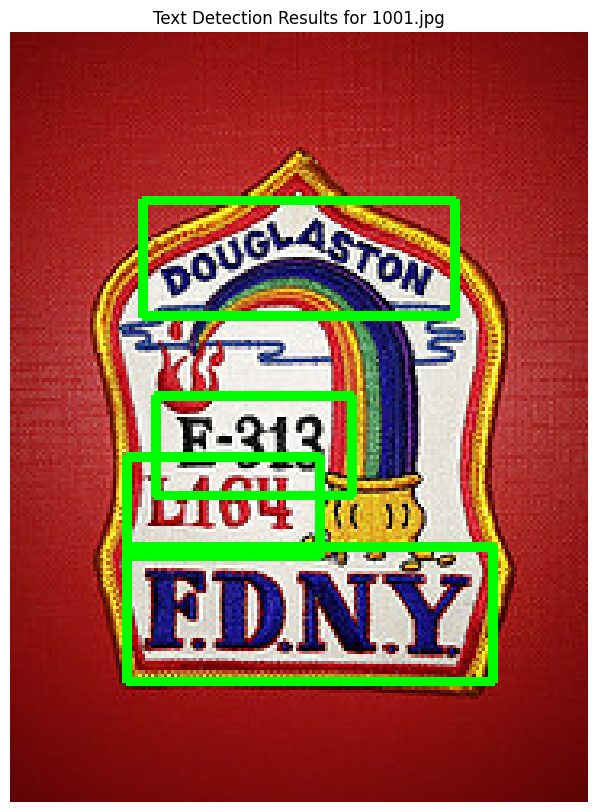


--- All detected text for 1001.jpg (also saved to /content/extracted_text.txt) ---
Poa
313)
, ach

Ligh
oa ee

FDN.
---

Processing image: 1006.jpg
Found 7 bounding boxes for 1006.jpg.
  Box 3: Detected text: BREWING*
  Box 4: Detected text: hs

1842
  Box 5: Detected text: ee

NAP BSA

2,

Mt

PAS


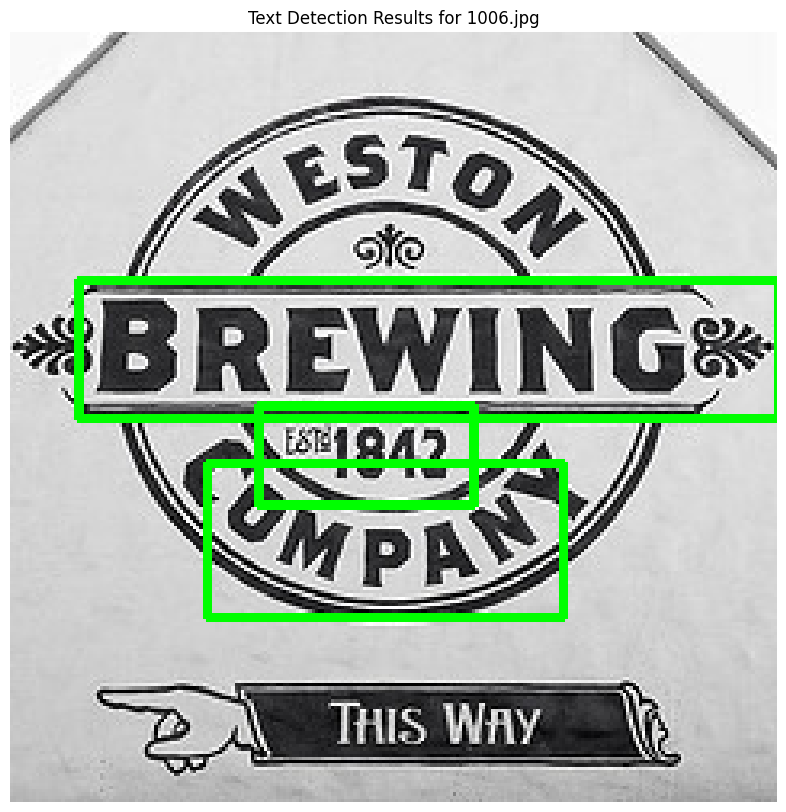


--- All detected text for 1006.jpg (also saved to /content/extracted_text.txt) ---
BREWING*
hs

1842
ee

NAP BSA

2,

Mt

PAS
---

Processing image: 1004.jpg
Found 7 bounding boxes for 1004.jpg.
  Box 6: Detected text: eeeiTUCK (


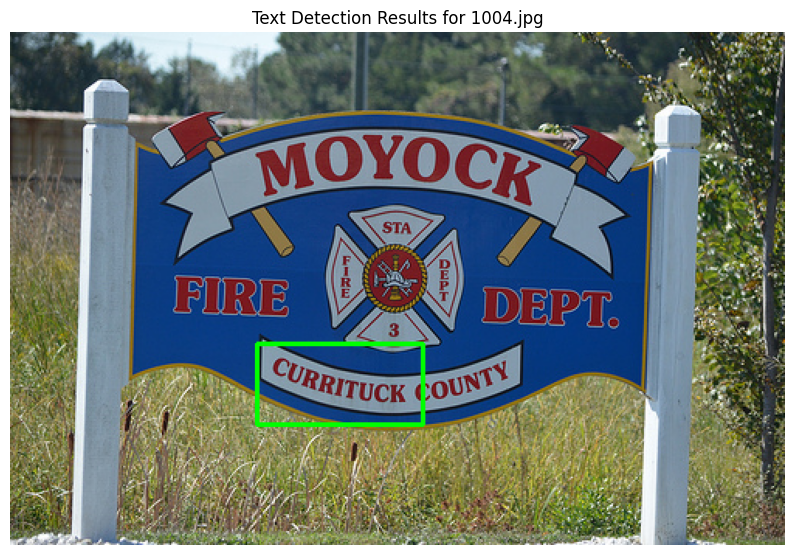


--- All detected text for 1004.jpg (also saved to /content/extracted_text.txt) ---
eeeiTUCK (
---

Processing image: 1007.jpg
Found 11 bounding boxes for 1007.jpg.
  Box 1: Detected text: for
  Box 3: Detected text: i
  Box 4: Detected text: ETS
  Box 5: Detected text: JRE!
  Box 6: Detected text: GONY
  Box 7: Detected text: 103,
  Box 8: Detected text: Le io oe |

LONDGN
  Box 9: Detected text: 2635
  Box 10: Detected text: SAFETY.
  Box 11: Detected text: FIRST.


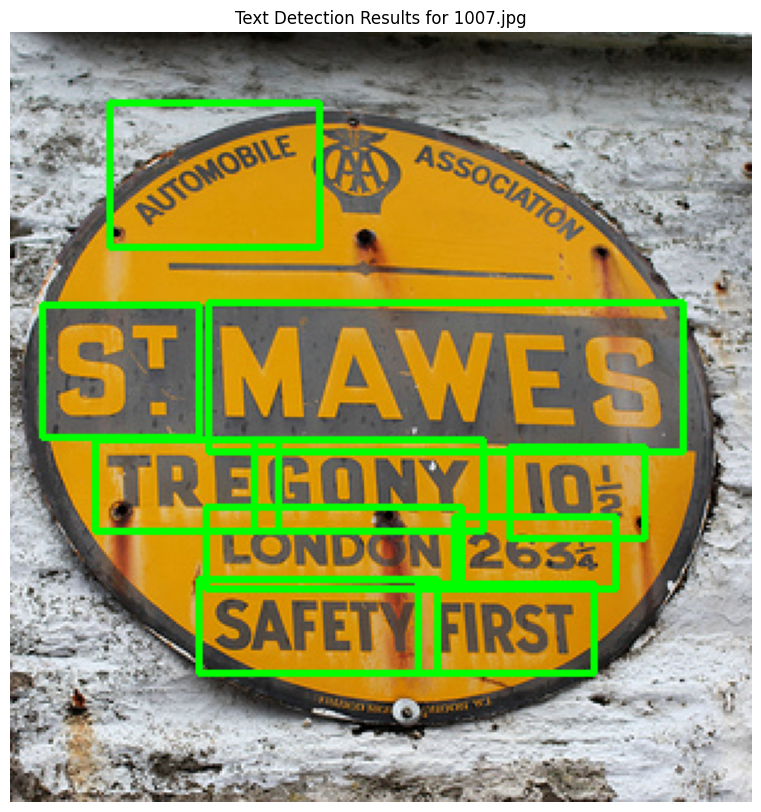


--- All detected text for 1007.jpg (also saved to /content/extracted_text.txt) ---
for
i
ETS
JRE!
GONY
103,
Le io oe |

LONDGN
2635
SAFETY.
FIRST.
---

Processing image: 1008.jpg
Found 3 bounding boxes for 1008.jpg.
  Box 1: Detected text: 4

Way
  Box 2: Detected text: Satit


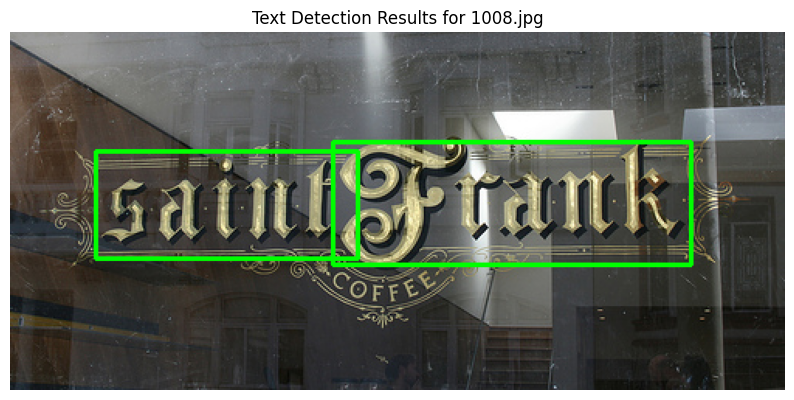


--- All detected text for 1008.jpg (also saved to /content/extracted_text.txt) ---
4

Way
Satit
---

Processing image: 1009.jpg
Found 4 bounding boxes for 1009.jpg.
  Box 1: Detected text: 1)
  Box 2: Detected text: POAt
  Box 3: Detected text: WZ


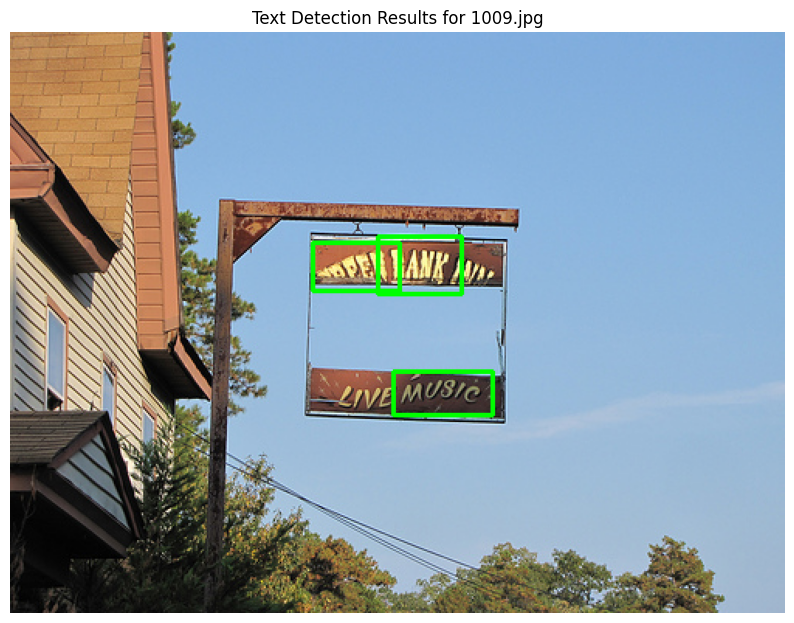


--- All detected text for 1009.jpg (also saved to /content/extracted_text.txt) ---
1)
POAt
WZ
---

Processing image: 1003.jpg
Found 3 bounding boxes for 1003.jpg.
  Box 1: Detected text: <\REFIGH Ep
  Box 2: Detected text: ee
  Box 3: Detected text: CHICAGO


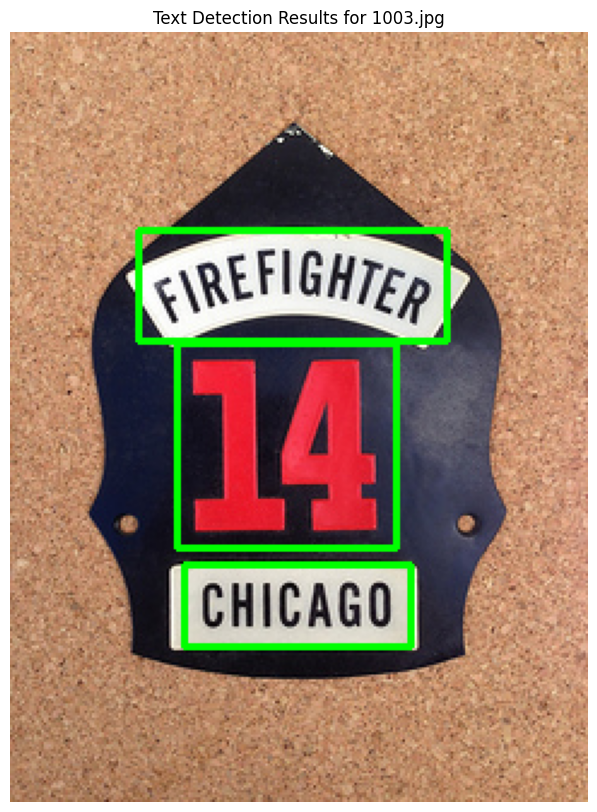


--- All detected text for 1003.jpg (also saved to /content/extracted_text.txt) ---
<\REFIGH Ep
ee
CHICAGO
---

Processing image: 1002.jpg
Found 5 bounding boxes for 1002.jpg.
  Box 1: Detected text: TT
  Box 3: Detected text: \since
  Box 4: Detected text: food


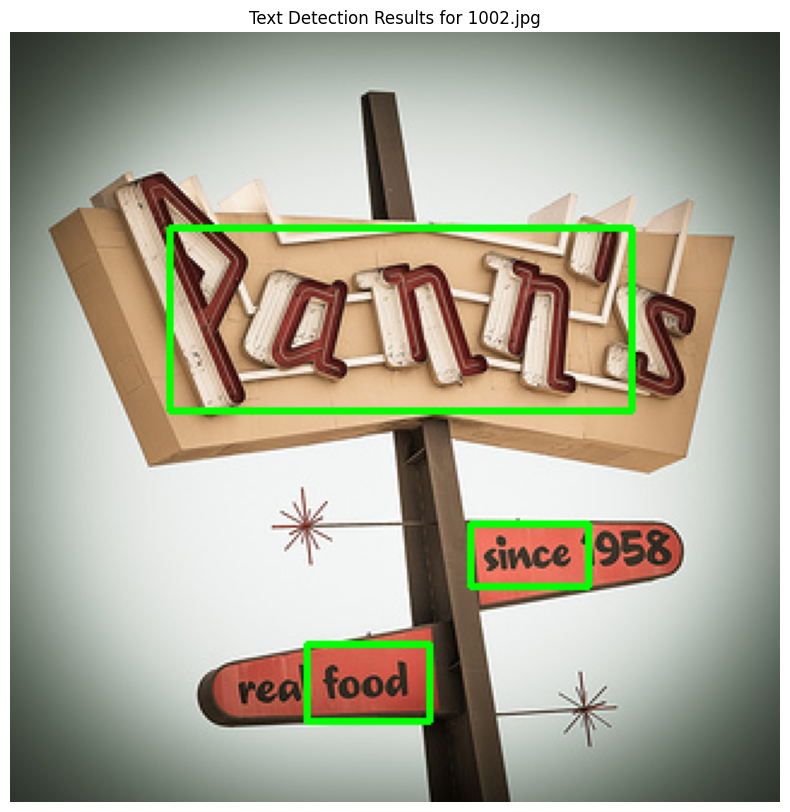


--- All detected text for 1002.jpg (also saved to /content/extracted_text.txt) ---
TT
\since
food
---

Processing image: 1010.jpg
Found 7 bounding boxes for 1010.jpg.
  Box 1: Detected text: Ses
  Box 2: Detected text: ers
  Box 3: Detected text: ira

cas
  Box 4: Detected text: a

T ee aoe

et eee

7) ae
  Box 5: Detected text: adil

evel
  Box 6: Detected text: COVE
  Box 7: Detected text: PERKINS


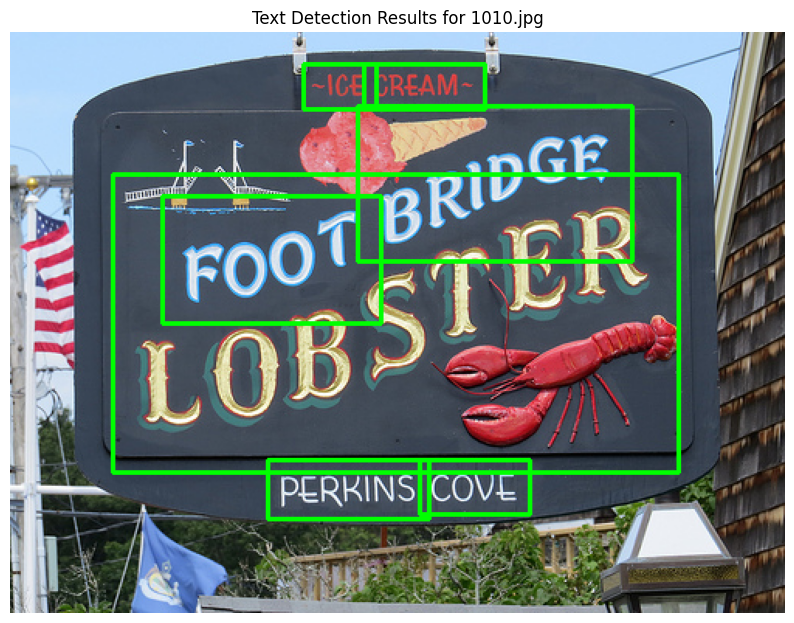


--- All detected text for 1010.jpg (also saved to /content/extracted_text.txt) ---
Ses
ers
ira

cas
a

T ee aoe

et eee

7) ae
adil

evel
COVE
PERKINS
---

Processing image: 1005.jpg
Found 9 bounding boxes for 1005.jpg.
  Box 1: Detected text: ST

ee
  Box 2: Detected text: bi

a
  Box 3: Detected text: LOR TIT
  Box 6: Detected text: wae

a
  Box 8: Detected text: feme
  Box 9: Detected text: pS


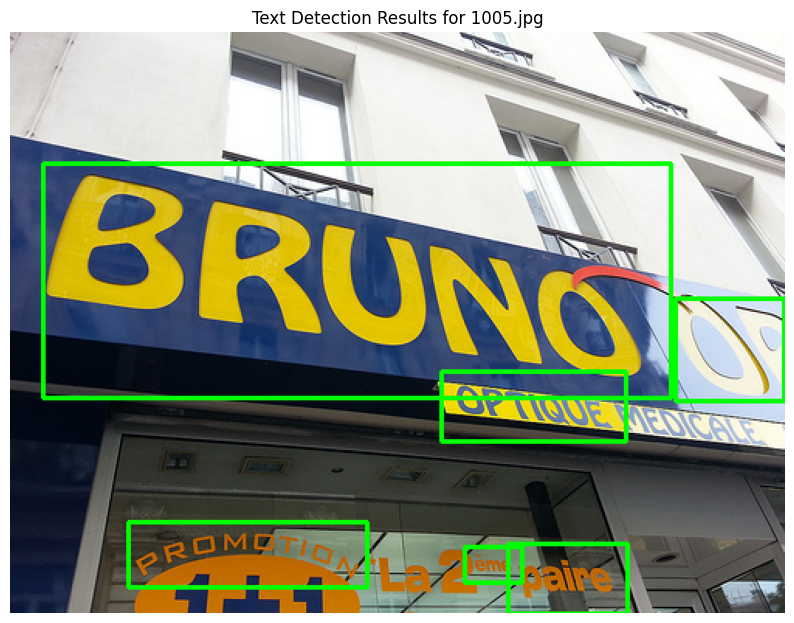


--- All detected text for 1005.jpg (also saved to /content/extracted_text.txt) ---
ST

ee
bi

a
LOR TIT
wae

a
feme
pS
---

✅ Text extraction from detected regions process finished. Extracted text saved to /content/extracted_text.txt


In [4]:
!pip install pytesseract
!sudo apt-get update
!sudo apt-get install tesseract-ocr

import os
import cv2
import pytesseract
import matplotlib.pyplot as plt
import numpy as np

# Path to the folder containing your uploaded images
user_images_folder = '/content/user_images'
# Path to the folder containing the text detection results (bounding boxes in .txt files)
result_folder = '/content/CRAFT-pytorch/result'
# Path for the output text file
output_text_file = '/content/extracted_text.txt'

# Check if the user's images folder exists and contains files
if not os.path.exists(user_images_folder) or not os.listdir(user_images_folder):
    print(f"❌ User images folder not found or is empty at {user_images_folder}. Please upload your images.")
elif not os.path.exists(result_folder):
     print(f"❌ Result folder not found at {result_folder}. Please run the text detection model first to generate bounding boxes.")
elif not os.listdir(result_folder):
     print(f"❌ Result folder is empty at {result_folder}. Please run the text detection model first to generate bounding boxes.")
else:
    print(f"✅ Using images from: {user_images_folder}")
    print(f"✅ Using detection results from: {result_folder}")

    # Open the output file in write mode to clear any previous content
    with open(output_text_file, 'w', encoding='utf-8') as outfile:
        outfile.write("--- Extracted Text from Images ---\n\n")


    # Get a list of image files in the user images folder
    image_files = [f for f in os.listdir(user_images_folder) if f.lower().endswith((".jpg", ".jpeg", ".png", ".bmp", ".tiff"))]

    if not image_files:
        print(f"❌ No image files found in {user_images_folder}. Please make sure your uploaded files are images.")
    else:
        print(f"Found {len(image_files)} images to process.")
        # Define Tesseract config with PSM 11 for sparse/curved text
        tesseract_config = '--psm 11'
        print(f"Using Tesseract config: {tesseract_config}")


        for img_file in image_files:
            img_path = os.path.join(user_images_folder, img_file)
            result_txt_file = os.path.join(result_folder, "res_" + os.path.splitext(img_file)[0] + '.txt')

            print(f"\nProcessing image: {img_file}")

            # Check if the corresponding result file exists
            if not os.path.exists(result_txt_file):
                print(f"❌ No result file found for {img_file} at {result_txt_file}. Skipping.")
                continue

            # Load the image
            img = cv2.imread(img_path)

            if img is None:
                print(f"❌ Failed to load image: {img_file}")
                continue

            # Convert the image to RGB (Tesseract works better with RGB)
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            detected_text = []

            # Read the bounding box coordinates from the result file
            try:
                with open(result_txt_file, 'r') as f:
                    lines = f.readlines()

                print(f"Found {len(lines)} bounding boxes for {img_file}.")

                # Iterate through each bounding box and perform OCR on the cropped region
                img_with_boxes_for_display = img_rgb.copy() # Create a copy for drawing boxes

                for i, line in enumerate(lines):
                    try:
                        # Coordinates are expected to be in the format x1,y1,x2,y2,x3,y3,x4,y4
                        coords = [int(c) for c in line.strip().split(',')]
                        # Reshape to a polygon if it's a quad (8 points)
                        if len(coords) == 8:
                            points = np.array(coords).reshape((-1, 2))
                            # Get bounding box from polygon
                            x, y, w, h = cv2.boundingRect(points)
                            # Add a small buffer
                            buffer = 5
                            x = max(0, x - buffer)
                            y = max(0, y - buffer)
                            w = w + 2 * buffer
                            h = h + 2 * buffer
                            x2 = x + w
                            y2 = y + h

                        elif len(coords) == 4:
                             # Assuming format is x1,y1,x2,y2 for a rectangle
                             x, y, x2, y2 = coords
                             # Ensure coordinates are in correct order
                             x, x2 = min(x, x2), max(x, x2)
                             y, y2 = min(y, y2), max(y, y2)
                             w, h = x2 - x, y2 - y


                        else:
                            print(f"⚠️ Skipping invalid bounding box format in {result_txt_file} line {i+1}: {line.strip()}")
                            continue

                        # Ensure coordinates are within image bounds
                        img_h, img_w, _ = img_rgb.shape
                        x = max(0, x)
                        y = max(0, y)
                        x2 = min(img_w, x2)
                        y2 = min(img_h, y2)


                        # Crop the image to the bounding box region
                        cropped_img = img_rgb[y:y2, x:x2]

                        if cropped_img.shape[0] > 0 and cropped_img.shape[1] > 0:
                            # Apply Tesseract OCR to the cropped region
                            text = pytesseract.image_to_string(cropped_img, config=tesseract_config).strip()

                            if text:
                                detected_text.append(text)
                                print(f"  Box {i+1}: Detected text: {text}")
                                # Draw the bounding box on the display image
                                cv2.rectangle(img_with_boxes_for_display, (x, y), (x2, y2), (0, 255, 0), 2)
                                # Optional: Put detected text on the image (can be noisy)
                                # cv2.putText(img_with_boxes_for_display, text, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)


                        else:
                             print(f"⚠️ Skipped empty cropped region for box {i+1}.")


                    except ValueError:
                        print(f"⚠️ Skipping line with invalid coordinates in {result_txt_file} line {i+1}: {line.strip()}")
                        continue
                    except Exception as e:
                        print(f"❌ An error occurred during processing box {i+1} for {img_file}: {e}")


                # Display the image with bounding boxes drawn by the CRAFT model
                # Note: The boxes drawn here are from the .txt file, not Tesseract's detection
                plt.figure(figsize=(10, 10))
                plt.imshow(img_with_boxes_for_display)
                plt.title(f"Text Detection Results for {img_file}")
                plt.axis('off')
                plt.show()

                # Append all detected text for the image to the output file
                with open(output_text_file, 'a', encoding='utf-8') as outfile:
                    outfile.write(f"\n--- Extracted Text from {img_file} ---\n")
                    if detected_text:
                        for text in detected_text:
                            outfile.write(f"{text}\n")
                    else:
                        outfile.write("No text detected in any bounding box.\n")
                    outfile.write("---\n")

                # Print to console for immediate feedback
                print(f"\n--- All detected text for {img_file} (also saved to {output_text_file}) ---")
                if detected_text:
                    for text in detected_text:
                        print(text)
                else:
                    print("No text detected in any bounding box.")
                print("---")


            except FileNotFoundError:
                 print(f"❌ Result file not found at {result_txt_file}. Please ensure the text detection model ran successfully.")
            except Exception as e:
                print(f"❌ An error occurred while reading the result file {result_txt_file}: {e}")


print("\n✅ Text extraction from detected regions process finished. Extracted text saved to", output_text_file)

In [7]:
# ============================
# STEP 1: Install Dependencies
# ============================
!pip install easyocr pyspellchecker gradio

# ============================
# STEP 2: Import Libraries
# ============================
import easyocr
from spellchecker import SpellChecker
import gradio as gr

# ============================
# STEP 3: Initialize OCR + Spellchecker
# ============================
# Add more language codes if needed: ['en','hi','kn','ta','te']
reader = easyocr.Reader(['en','kn'])   # English by default
spell = SpellChecker()

# ============================
# STEP 4: OCR + Spell Check Function
# ============================
def ocr_pipeline(image):
    # OCR detection
    result = reader.readtext(image)

    # Extract raw text
    text = " ".join([t for _, t, _ in result])

    # Spell-check correction
    corrected = " ".join([spell.correction(word) or word for word in text.split()])

    return text, corrected

# ============================
# STEP 5: Create Gradio Interface
# ============================
demo = gr.Interface(
    fn=ocr_pipeline,
    inputs=gr.Image(type="filepath", label="Upload Image"),
    outputs=[gr.Textbox(label="Extracted Text"), gr.Textbox(label="Corrected Text")],
    title="OCR with EasyOCR + Spell Check",
    description="Upload an image with text. The system extracts text using EasyOCR and improves it with spell-checking."
)

# ============================
# STEP 6: Launch
# ============================
demo.launch(share=True)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 29.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 100.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 180.7/180.7 kB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 963.8/963.8 kB 46.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 292.1/292.1 kB 16.5 MB/s eta 0:00:00


Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% CompleteColab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://ac8a1588964c1fa3a8.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
